In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from pyod.models.auto_encoder import AutoEncoder
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve , auc , accuracy_score
from sklearn.metrics import (precision_recall_curve, roc_curve, roc_auc_score,
                             accuracy_score, precision_score, recall_score, f1_score)
from pyod.models.auto_encoder import AutoEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
data_scaled = pd.read_csv("scaled_training_dataset.csv")
data_test_scaled = pd.read_csv("scaled_test_dataset.csv")

In [4]:
def plot_elbow_method(data, selected_features, max_clusters=10):
    X = data[selected_features].values
    distortions = []
    for i in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=i, random_state=42)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)
    
    plt.figure(figsize=(8,6))
    plt.plot(range(1, max_clusters + 1), distortions, marker='o')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Distortion')
    plt.show()


In [5]:

def cluster_and_plot_with_pca(data_scaled, selected_features_clusters, target='is_fraud', n_clusters=3):
    data_cluster = data_scaled[selected_features_clusters].copy()
    data_cluster[target] = data_scaled[target]
    data_cluster['cc_num'] = data_scaled['cc_num']
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    data_cluster['cluster'] = kmeans.fit_predict(data_cluster[selected_features_clusters])
    
    data_cluster.set_index('cc_num', inplace=True)
    
    print(f"Clusters added to DataFrame: {data_cluster['cluster'].unique()}")  
    print(data_cluster.head())
    
    summary_stats = data_cluster.groupby('cluster')[selected_features_clusters].agg(['mean', 'median'])
    print("\nSummary Statistics for Each Cluster:")
    print(summary_stats)
    
    print("\nFeature Distributions per Cluster (Summary):")
    for feature in selected_features_clusters:
        cluster_stats = data_cluster.groupby('cluster')[feature].describe()
        print(f"\nFeature: {feature}")
        print(cluster_stats)
    
    centroids = kmeans.cluster_centers_
    print("\nCluster Centroids:")
    for i, centroid in enumerate(centroids):
        print(f"Centroid {i}:")
        for feature, value in zip(selected_features_clusters, centroid):
            print(f"  {feature}: {value:.4f}")
    
    pca = PCA(n_components=2)
    reduced_features = pca.fit_transform(data_cluster[selected_features_clusters])
    
    print("\nExplained Variance Ratio of Each PCA Component:")
    for i, variance in enumerate(pca.explained_variance_ratio_):
        print(f"Component {i + 1}: {variance:.4f}")
    
    print("\nPCA Components (Feature Importance):")
    for i, component in enumerate(pca.components_):
        feature_importances = zip(selected_features_clusters, component)
        sorted_importances = sorted(feature_importances, key=lambda x: abs(x[1]), reverse=True)
        print(f"\nComponent {i + 1}:")
        for feature, importance in sorted_importances:
            print(f"{feature}: {importance:.4f}")
    
    data_cluster['Component 1'] = reduced_features[:, 0]
    data_cluster['Component 2'] = reduced_features[:, 1]
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(x='Component 1', y='Component 2', hue='cluster', data=data_cluster, palette='viridis', alpha=0.7)
    plt.title(f'KMeans Clustering Visualized with PCA')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()

    plt.figure(figsize=(8,6))
    sns.scatterplot(x='Component 1', y='Component 2', hue=target, data=data_cluster, palette='viridis', alpha=0.7)
    plt.title(f'Fraud Distribution Visualized with PCA')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()
    
    return data_cluster


Clustering the selected features can indeed provide insights into the importance and role of card-related features. Here's how:

Behavioral Segmentation: By clustering features related to card transactions (e.g., amt, amt_rolling_mean_7d, avg_daily_trans, etc.), you can identify distinct behavioral segments. This helps in understanding how different groups of cardholders behave, which can be crucial in detecting anomalies or fraudulent patterns.

Feature Contribution: The clusters formed will highlight how these card-related features contribute to grouping transactions. For instance, if amt_rolling_mean_7d plays a significant role in defining clusters, it suggests that recent spending behavior is a critical factor in differentiating transaction patterns.

Fraud Detection: In fraud detection, understanding the importance of card features within clusters helps in identifying which aspects of cardholder behavior are most indicative of fraud. For example, a cluster with unusually high amt values might be more prone to fraudulent activities.

Feature Interaction: Clustering reveals how these features interact and whether certain combinations of features (e.g., high transaction amounts with low category_diversity) are more common in certain clusters. This interaction is often key in understanding the underlying dynamics of card usage.

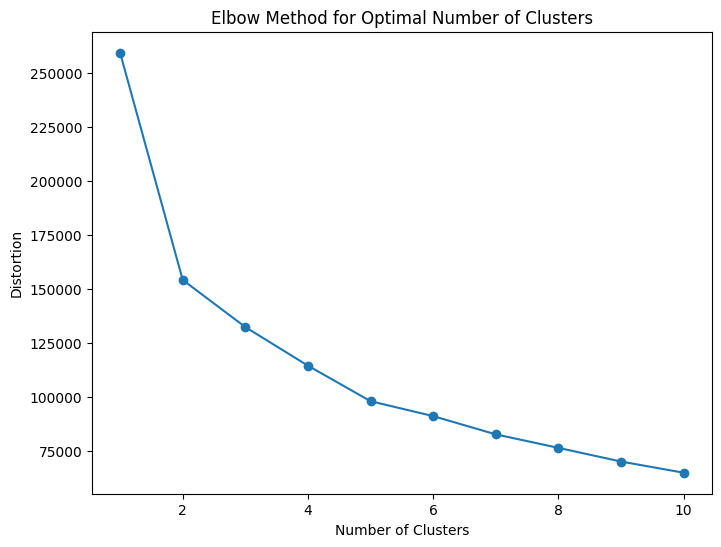

In [6]:
selected_card_features_clusters= ['category_diversity', 'amt_rolling_mean_7d','age_spend_ratio','amt','amt_rolling_mean_15d','avg_daily_trans','num_trans_per_card','distance_between_transactions','distance_between_cardholder_merchant','amt_std','amt_range']
plot_elbow_method(data_scaled, selected_card_features_clusters)

Clusters added to DataFrame: [1 0]
             category_diversity  amt_rolling_mean_7d  age_spend_ratio  \
cc_num                                                                  
60416207185                 1.0             0.006770         0.001698   
60416207185                 1.0             0.010865         0.002650   
60416207185                 1.0             0.010118         0.001104   
60416207185                 1.0             0.009310         0.000856   
60416207185                 1.0             0.007972         0.000192   

                  amt  amt_rolling_mean_15d  avg_daily_trans  \
cc_num                                                         
60416207185  0.001794              0.014275         0.482007   
60416207185  0.002801              0.022909         0.482007   
60416207185  0.001167              0.021334         0.482007   
60416207185  0.000904              0.019631         0.482007   
60416207185  0.000203              0.016808         0.482007   

    

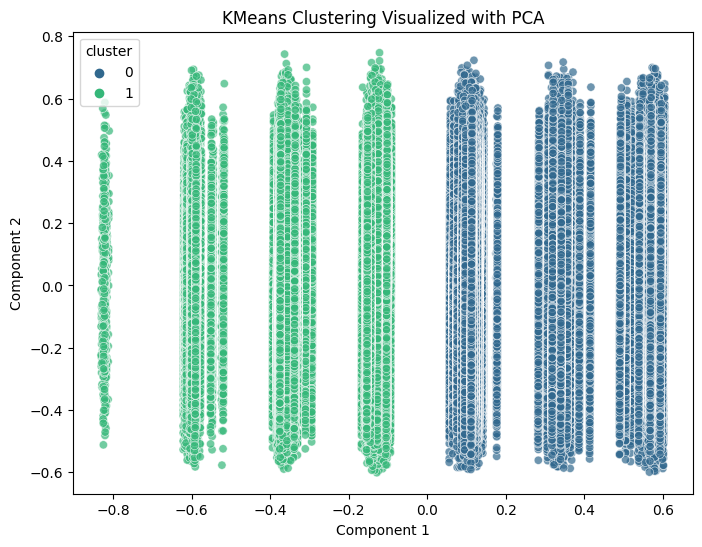

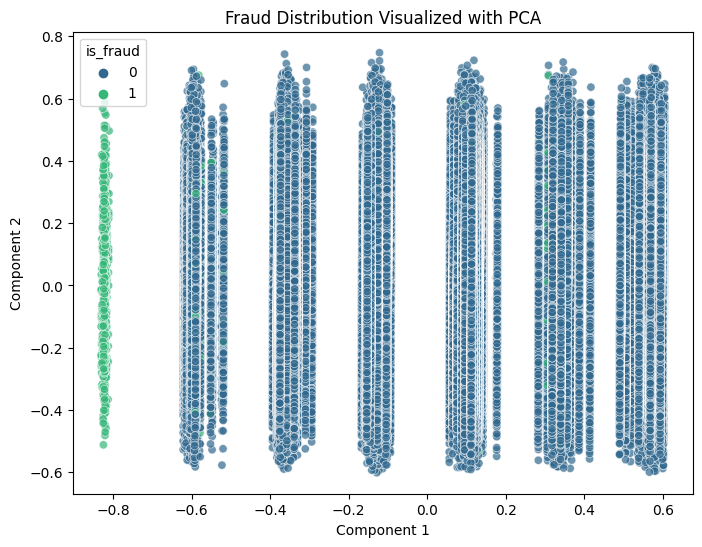

Clusters added to DataFrame: [1 0]
             category_diversity  amt_rolling_mean_7d  age_spend_ratio  \
cc_num                                                                  
60416207185                 1.0             0.030392         0.003405   
60416207185                 1.0             0.026716         0.002822   
60416207185                 1.0             0.026584         0.003810   
60416207185                 1.0             0.030164         0.006458   
60416207185                 1.0             0.025207         0.000080   

                  amt  amt_rolling_mean_15d  avg_daily_trans  \
cc_num                                                         
60416207185  0.003405              0.063817         0.450845   
60416207185  0.002822              0.056099         0.450845   
60416207185  0.003810              0.055822         0.450845   
60416207185  0.006458              0.063338         0.450845   
60416207185  0.000080              0.052930         0.450845   

    

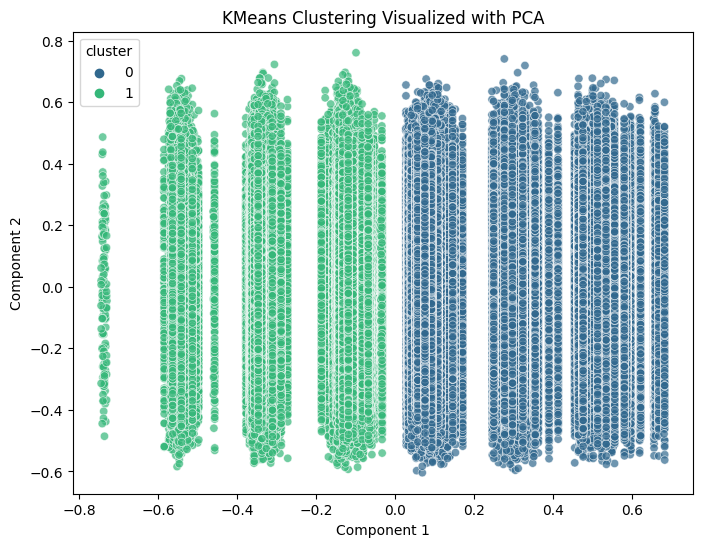

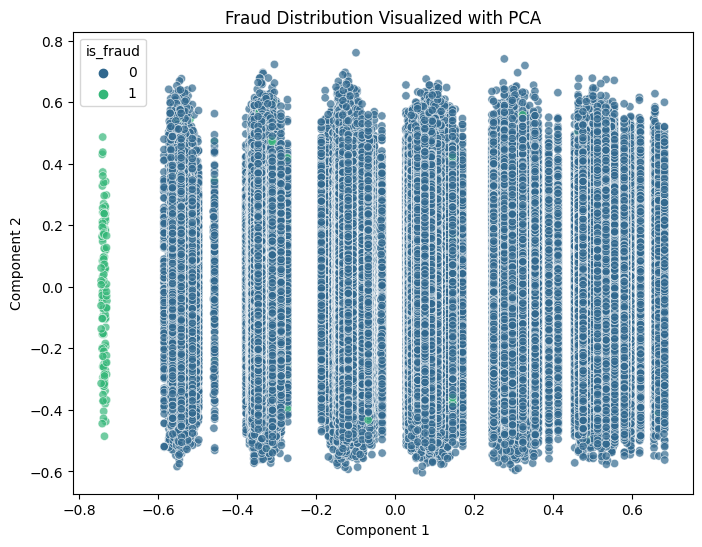

In [7]:
optimal_n_clusters =2
data_cluster_card = cluster_and_plot_with_pca(data_scaled, selected_card_features_clusters, n_clusters=optimal_n_clusters)
data_cluster_card_test = cluster_and_plot_with_pca(data_test_scaled,selected_card_features_clusters,n_clusters=optimal_n_clusters)


- Cluster 0: Generally characterized by higher avg_daily_trans, num_trans_per_card, amt_range, and slightly lower amt_std.
- Cluster 1: Features lower values in avg_daily_trans, num_trans_per_card, and amt_range, but higher amt_std.

- Summary Statistics
Cluster 0:
Higher category_diversity, avg_daily_trans, num_trans_per_card, and amt_range.
More transactions per day and more diverse spending categories.
Cluster 1:
Slightly lower category_diversity and significantly lower avg_daily_trans and num_trans_per_card.
A higher standard deviation in the transaction amounts (amt_std).

-Most features show small differences between clusters, but avg_daily_trans, num_trans_per_card, and amt_range are more distinct.
- Component 1 is heavily influenced by avg_daily_trans and num_trans_per_card, while Component 2 is more influenced by distance_between_cardholder_merchant and distance_between_transactions.
- Component 1 explains 57.36% of the variance.
- Component 2 explains 22.72% of the variance.
- Component Importance:
Component 1 is dominated by transaction frequency (avg_daily_trans, num_trans_per_card).
Component 2 is dominated by distance metrics (distance_between_cardholder_merchant, distance_between_transactions).
 

- Fraud Distribution Visualized with PCA" shows that fraudulent transactions are distinctly identifiable compared to normal transactions, which helps improve fraud detection 

**Comparaison with EDA**
- In comparison with the EDA, fraudulent transactions tend to cover a wider range of amounts and exhibit multiple peaks, indicating more varied patterns compared to non-fraudulent transactions. This observation aligns with the cluster analysis, where Cluster 1, characterized by higher variability in transaction amounts, may correspond to the more diverse fraudulent transaction amounts seen in the histogram. Additionally, the differences in avg_daily_trans and num_trans_per_card between the clusters reflect the variation in transaction frequency and amounts observed in the histograms. 

- The EDA visual supports the clustering summary, especially regarding the distribution of transaction amounts and the variability between fraudulent and non-fraudulent transactions.


In [8]:
fraudulent_summary_by_cluster = data_cluster_card[data_cluster_card['is_fraud'] == 1].groupby('cluster').size()
print(fraudulent_summary_by_cluster)


cluster
0    2029
1    5402
dtype: int64


fradulent transactions are more present in the cluster 1( with low transactions and amount )

## Applying clustering with merchant features

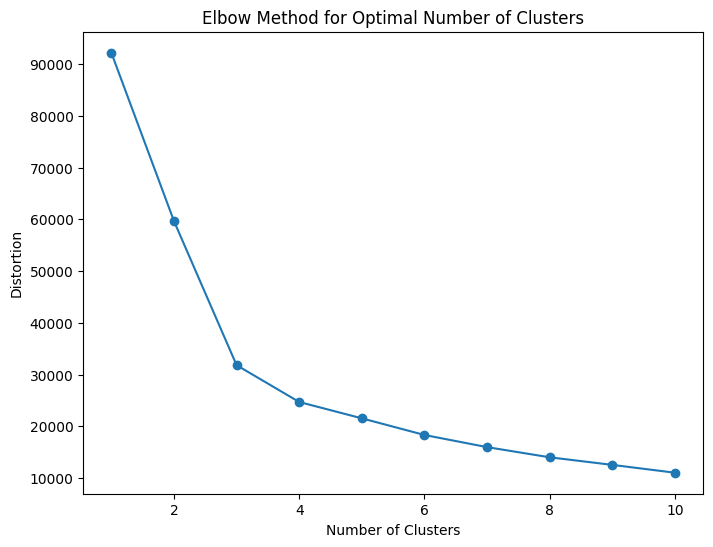

In [28]:
selected_merchant_features_clusters= ['amt','distance_between_cardholder_merchant', 'merchant_amt_rolling_mean_7d', 
    'merchant_amt_rolling_mean_15d','unique_clients_count']
plot_elbow_method(data_scaled,selected_merchant_features_clusters)

Clusters added to DataFrame: [0 1 2]
                  amt  distance_between_cardholder_merchant  \
cc_num                                                        
60416207185  0.001794                              0.725117   
60416207185  0.002801                              0.143101   
60416207185  0.001167                              0.573208   
60416207185  0.000904                              0.487792   
60416207185  0.000203                              0.459994   

             merchant_amt_rolling_mean_7d  merchant_amt_rolling_mean_15d  \
cc_num                                                                     
60416207185                      0.015725                       0.032932   
60416207185                      0.015601                       0.032672   
60416207185                      0.012580                       0.026345   
60416207185                      0.014102                       0.028492   
60416207185                      0.001010                       0

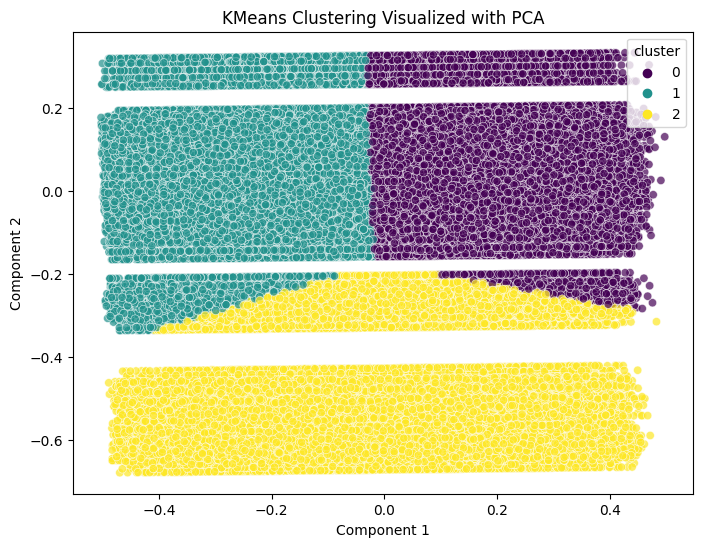

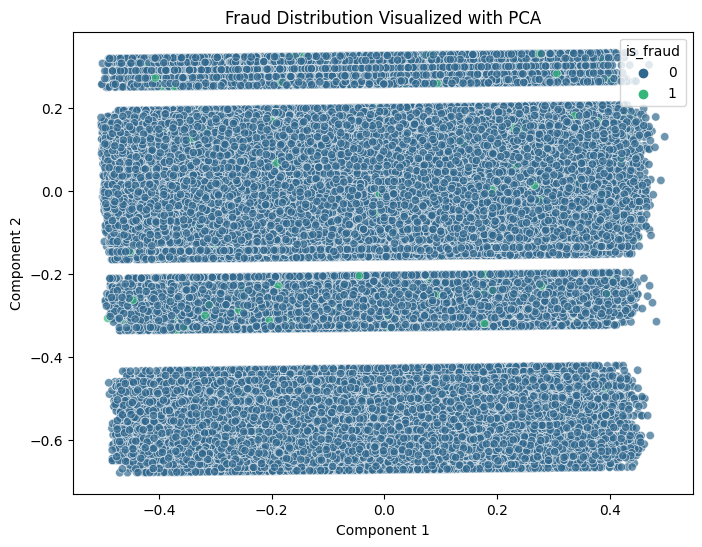

Clusters added to DataFrame: [0 2 1]
                  amt  distance_between_cardholder_merchant  \
cc_num                                                        
60416207185  0.003405                              0.608885   
60416207185  0.002822                              0.807259   
60416207185  0.003810                              0.432963   
60416207185  0.006458                              0.253234   
60416207185  0.000080                              0.410232   

             merchant_amt_rolling_mean_7d  merchant_amt_rolling_mean_15d  \
cc_num                                                                     
60416207185                      0.018553                       0.037859   
60416207185                      0.013868                       0.028299   
60416207185                      0.015024                       0.035643   
60416207185                      0.010507                       0.025157   
60416207185                      0.015027                       0

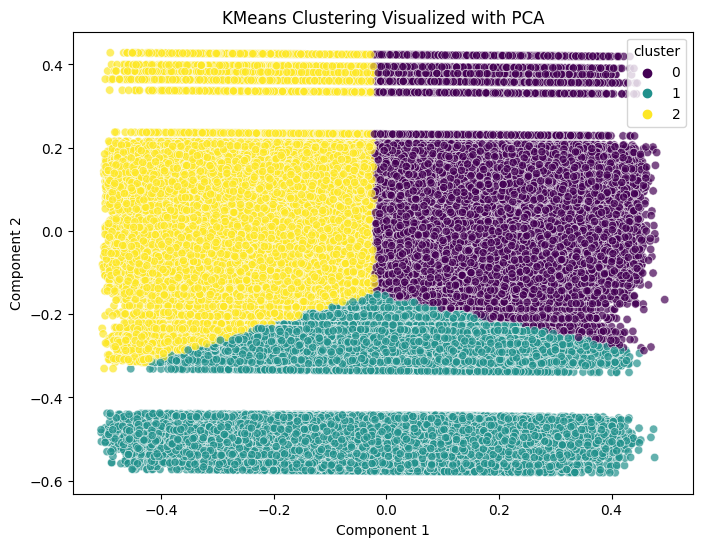

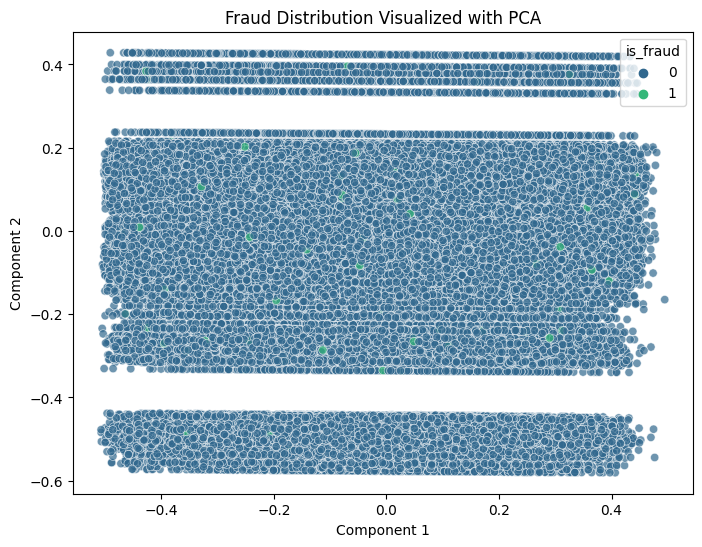

In [29]:
optimal_n_clusters =3
data_cluster_merchant= cluster_and_plot_with_pca(data_scaled, selected_merchant_features_clusters, n_clusters=optimal_n_clusters)
data_cluster_merchant_test = cluster_and_plot_with_pca(data_test_scaled,selected_merchant_features_clusters,n_clusters=optimal_n_clusters)



---
### **Clusters Identified**

- **Cluster 0**: Represents the majority of transactions with a moderate distance between the cardholder and merchant, and typical rolling mean values for merchant transactions.
  
- **Cluster 1**: Characterized by transactions with slightly higher amounts and a relatively lower distance between the cardholder and merchant.
  
- **Cluster 2**: Includes transactions with the lowest distance between cardholder and merchant and higher amounts compared to Cluster 0.

### **Key Insights**

- **Cluster 0**:
  - Most common cluster.
  - Transactions have moderate amounts and distances, indicating standard transaction behavior.
  
- **Cluster 1**:
  - Transactions have higher amounts but lower client engagement (unique clients count).
  - This could indicate premium or less frequent transactions.
  
- **Cluster 2**:
  - Transactions have the lowest distance, suggesting frequent interactions or proximity-related factors.
  - High transaction amounts could indicate significant business dealings or frequent small transactions.

### **PCA Explained Variance Ratio**

- **Component 1 (52.77%)**:
  - Captures the variation due to the distance between the cardholder and merchant.
  - This component is crucial in distinguishing between transactions based on their geographical aspects.

- **Component 2 (46.15%)**:
  - Captures variation based on unique client counts, reflecting client engagement and frequency of transactions.

### **Feature Importance**

- **Component 1**:
  - The distance between cardholder and merchant is the most significant feature.
  - Geographical distance has a substantial impact on the component's value.

- **Component 2**:
  - Unique client count is overwhelmingly influential.
  - Client engagement is a key factor in differentiating transactions in this component.

### **Business Implications**

- **Fraud Detection**:
  - Transactions in Cluster 2 could be flagged for further inspection due to their high frequency and proximity, which may sometimes indicate unusual patterns or fraud.
  - Cluster 1 transactions, being higher value and less frequent, should be monitored for unusual activity.

---



## Merchant features with 2 clusters

Clusters added to DataFrame: [0 1]
                  amt  distance_between_cardholder_merchant  \
cc_num                                                        
60416207185  0.001794                              0.725117   
60416207185  0.002801                              0.143101   
60416207185  0.001167                              0.573208   
60416207185  0.000904                              0.487792   
60416207185  0.000203                              0.459994   

             merchant_amt_rolling_mean_7d  merchant_amt_rolling_mean_15d  \
cc_num                                                                     
60416207185                      0.015725                       0.032932   
60416207185                      0.015601                       0.032672   
60416207185                      0.012580                       0.026345   
60416207185                      0.014102                       0.028492   
60416207185                      0.001010                       0.0

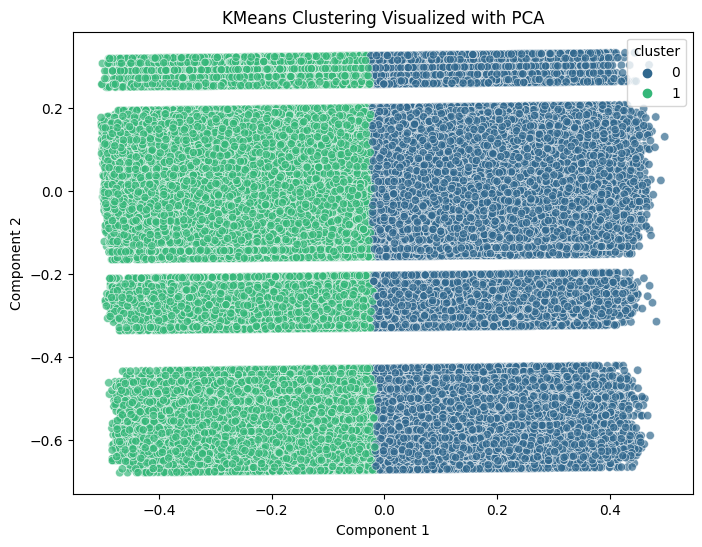

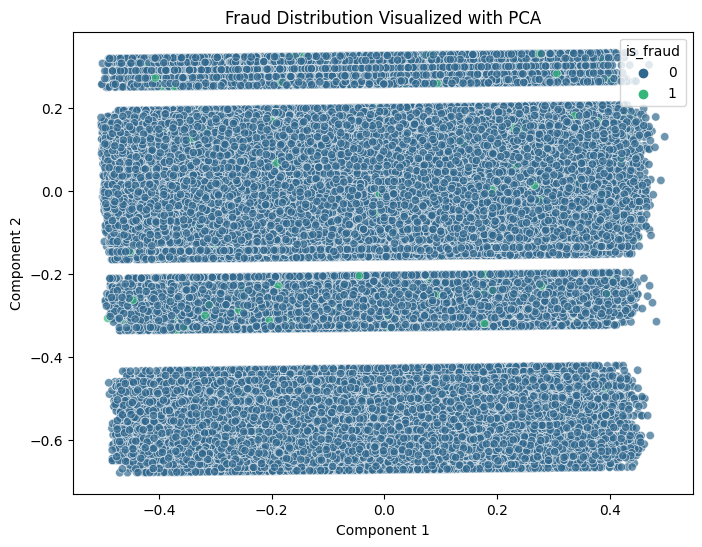

Clusters added to DataFrame: [0 1]
                  amt  distance_between_cardholder_merchant  \
cc_num                                                        
60416207185  0.003405                              0.608885   
60416207185  0.002822                              0.807259   
60416207185  0.003810                              0.432963   
60416207185  0.006458                              0.253234   
60416207185  0.000080                              0.410232   

             merchant_amt_rolling_mean_7d  merchant_amt_rolling_mean_15d  \
cc_num                                                                     
60416207185                      0.018553                       0.037859   
60416207185                      0.013868                       0.028299   
60416207185                      0.015024                       0.035643   
60416207185                      0.010507                       0.025157   
60416207185                      0.015027                       0.0

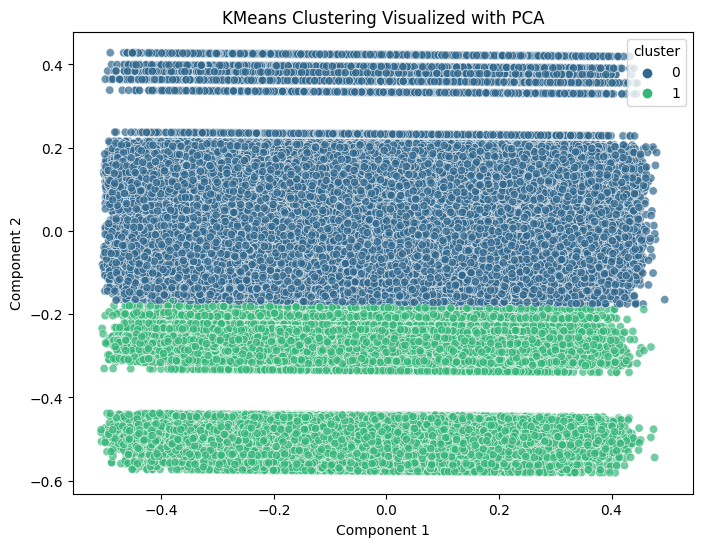

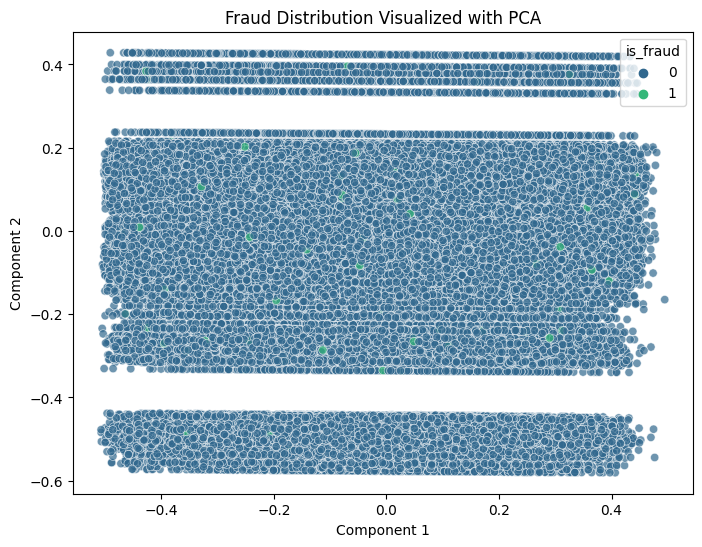

In [17]:
optimal_n_clusters=2
data_cluster_merchant_2= cluster_and_plot_with_pca(data_scaled, selected_merchant_features_clusters, n_clusters=optimal_n_clusters)
data_cluster_merchant_test_2= cluster_and_plot_with_pca(data_test_scaled,selected_merchant_features_clusters,n_clusters=optimal_n_clusters)



---

### **Cluster Analysis**

#### **Cluster 0:**
- **Transaction Amount (amt):** 
  - Lower mean and median compared to Cluster 1.
  - Indicates that transactions are generally smaller.
- **Distance Between Cardholder and Merchant:** 
  - Slightly higher distance.
  - May imply either legitimate transactions with less frequent interaction or high-risk transactions.
- **Merchant Rolling Mean (7d & 15d):** 
  - Lower values.
  - Suggests less frequent spending or lower transaction amounts over recent periods.
- **Unique Clients Count:** 
  - Higher number of unique clients.
  - Reflects higher engagement or a larger base of regular customers.

#### **Cluster 1:**
- **Transaction Amount (amt):** 
  - Higher mean and median.
  - Indicates larger transactions.
- **Distance Between Cardholder and Merchant:** 
  - Slightly lower distance.
  - Suggests transactions are occurring closer to the cardholder's location, possibly indicating regular, in-person transactions.
- **Merchant Rolling Mean (7d & 15d):** 
  - Higher values.
  - Indicates higher spending or more frequent transactions over recent periods.
- **Unique Clients Count:** 
  - Lower number of unique clients.
  - Could suggest targeted high-value transactions or less frequent but high-value transactions.

### **Business Implications:**
- **Cluster 0:** 
  - Represents regular, lower-value transactions from a wide base of clients.
  - Key for understanding typical spending patterns and distinguishing between normal transactions and potential fraud.
- **Cluster 1:** 
  - Indicates high-value transactions with fewer clients.
  - May require closer scrutiny for fraud detection due to larger transaction amounts and a less frequent client base.

---

### **PCA Insights**

#### **PCA Component Analysis:**

- **Component 1:**
  - **Key Feature:** `distance_between_cardholder_merchant` has the highest importance.
  - **Implication:** Distance plays a crucial role in distinguishing between different transaction types or anomalies.

- **Component 2:**
  - **Key Feature:** `unique_clients_count` is highly important.
  - **Implication:** The number of unique clients involved in transactions is significant in understanding transaction patterns and potential anomalies.

### **Business Implications from PCA:**
- **Distance Between Cardholder and Merchant:**
  - A large distance may signal unusual behavior, especially if it deviates from the norm of the client's usual spending patterns.
  - Its high importance in PCA indicates it's a critical factor in identifying anomalies.

- **Unique Clients Count:**
  - Monitoring changes in the number of unique clients interacting with a merchant can help detect anomalies.
  - A significant drop or rise might signal suspicious behavior, such as fraud.

---

### **Summary:**
- **Cluster 0:** 
  - Represents smaller, more frequent transactions from a broad customer base.
  - Useful for understanding normal transaction patterns.
- **Cluster 1:** 
  - Signifies high-value transactions from fewer clients.
  - Could be a point of focus for potential fraud detection.
- **Critical Features:** 
  - Distance and client count are essential for detecting anomalies.
  - Important for both normal transaction monitoring and fraud detection.

---



## Clustering for merchant features ( with more features )

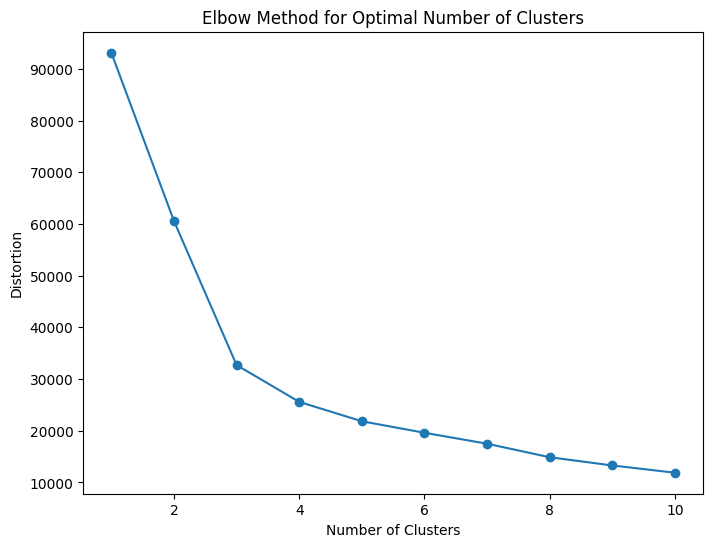

In [25]:
selected_merchant_features_clusters_3= ['amt','distance_between_cardholder_merchant', 'merchant_amt_rolling_mean_7d', 
    'merchant_amt_rolling_mean_15d','unique_clients_count','merchant_amt_rolling_mean_30d','merchant_amt_rolling_mean_365d']
plot_elbow_method(data_scaled,selected_merchant_features_clusters_3)

Clusters added to DataFrame: [0 1 2]
                  amt  distance_between_cardholder_merchant  \
cc_num                                                        
60416207185  0.001794                              0.725117   
60416207185  0.002801                              0.143101   
60416207185  0.001167                              0.573208   
60416207185  0.000904                              0.487792   
60416207185  0.000203                              0.459994   

             merchant_amt_rolling_mean_7d  merchant_amt_rolling_mean_15d  \
cc_num                                                                     
60416207185                      0.015725                       0.032932   
60416207185                      0.015601                       0.032672   
60416207185                      0.012580                       0.026345   
60416207185                      0.014102                       0.028492   
60416207185                      0.001010                       0

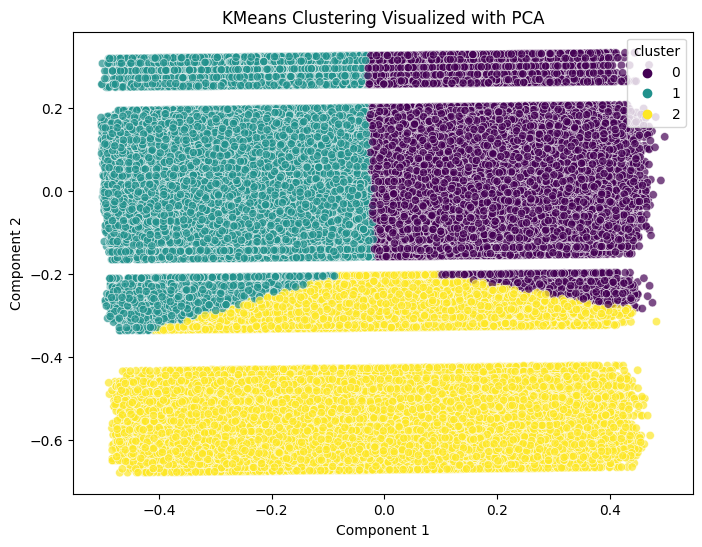

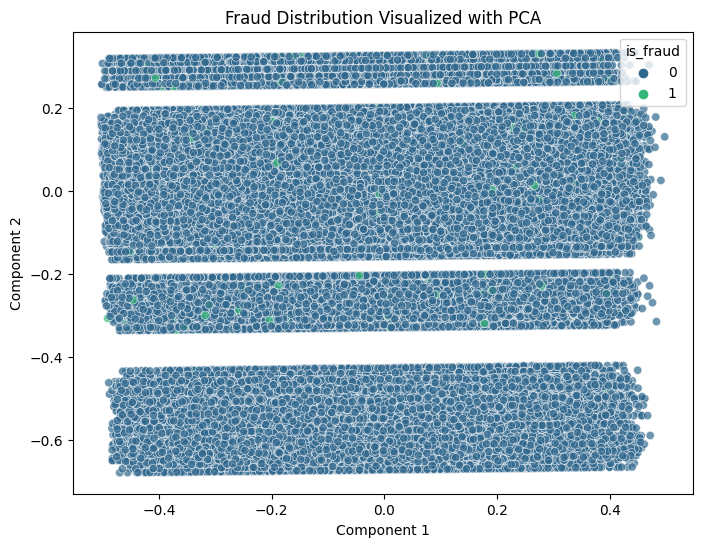

Clusters added to DataFrame: [0 1 2]
                  amt  distance_between_cardholder_merchant  \
cc_num                                                        
60416207185  0.003405                              0.608885   
60416207185  0.002822                              0.807259   
60416207185  0.003810                              0.432963   
60416207185  0.006458                              0.253234   
60416207185  0.000080                              0.410232   

             merchant_amt_rolling_mean_7d  merchant_amt_rolling_mean_15d  \
cc_num                                                                     
60416207185                      0.018553                       0.037859   
60416207185                      0.013868                       0.028299   
60416207185                      0.015024                       0.035643   
60416207185                      0.010507                       0.025157   
60416207185                      0.015027                       0

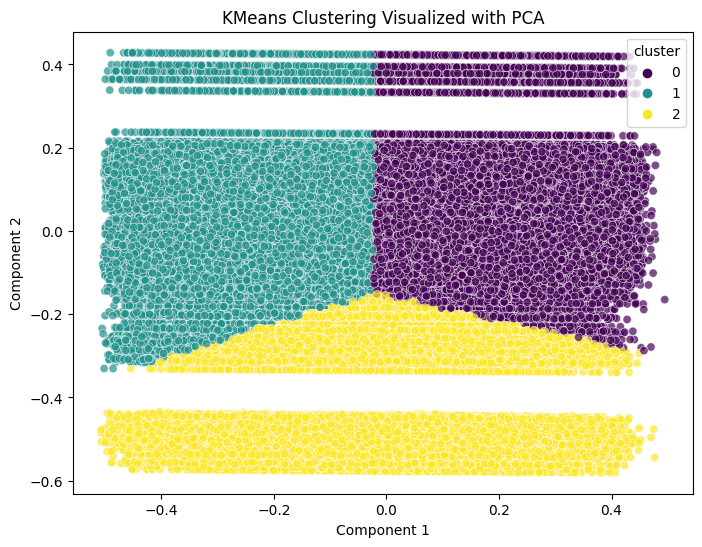

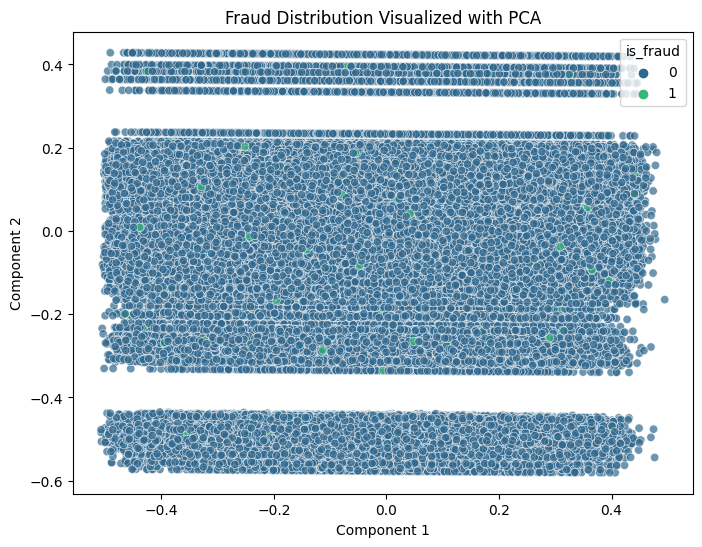

In [27]:
optimal_n_clusters =3
data_cluster_merchant_3= cluster_and_plot_with_pca(data_scaled, selected_merchant_features_clusters_3, n_clusters=optimal_n_clusters)
data_cluster_merchant_test_3= cluster_and_plot_with_pca(data_test_scaled,selected_merchant_features_clusters_3,n_clusters=optimal_n_clusters)


## Applying autoencoder with card features

In [8]:
def train_autoencoder_per_cluster(data, feature_columns, cluster_column='cluster', contamination=0.006, lr=0.001):
    """
    Train an autoencoder separately for each cluster in the provided data.
    """
    models = {}
    
    for cluster in data[cluster_column].unique():
        cluster_data = data[data[cluster_column] == cluster]
        X_train = cluster_data[feature_columns]
        
        model = AutoEncoder(contamination=contamination, lr=lr)
        model.fit(X_train)
        
        models[cluster] = model
    
    return models


In [9]:
feature_columns = [col for col in data_cluster_card.columns if col not in ['is_fraud', 'cluster', 'Component 1', 'Component 2']]
autoencoder_models = train_autoencoder_per_cluster(data_cluster_card, feature_columns, cluster_column='cluster')


Training: 100%|██████████| 10/10 [15:42<00:00, 94.28s/it]


In [10]:

def evaluate_autoencoder_on_test_per_cluster(autoencoder_models, data_cluster_card_test, feature_columns, cluster_column):
    cluster_results = {}
    """
    Evaluates the performance of autoencoder models on test data for each cluster.

    Parameters:
    - autoencoder_models: A dictionary or list of trained autoencoder models, one for each cluster.
    - data_cluster_card_test: A DataFrame containing the test data, including cluster information.
    - feature_columns: A list of feature column names used for evaluation.
    - cluster_column: The name of the column in data_cluster_card_test that indicates cluster membership.

    Returns:
    - cluster_results: A dictionary or DataFrame containing evaluation metrics for each cluster.
    """
    for cluster in data_cluster_card_test[cluster_column].unique():
        cluster_data = data_cluster_card_test[data_cluster_card_test[cluster_column] == cluster]
        
        X_test = cluster_data[feature_columns].values
        y_test = cluster_data['is_fraud'].values
        
        autoencoder_model = autoencoder_models.get(cluster)
        if autoencoder_model is None:
            print(f"Warning: No model found for cluster {cluster}. Skipping.")
            continue
        
        anomaly_scores = autoencoder_model.decision_function(X_test)
        
        threshold = np.percentile(anomaly_scores,97)
        
        y_pred = (anomaly_scores > threshold).astype(int)
        
        cm = confusion_matrix(y_test, y_pred)
        
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Fraud', 'Fraud'])
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f'Confusion Matrix for Cluster {cluster}')
        plt.show()
        
        fpr, tpr, _ = roc_curve(y_test, anomaly_scores)
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic for Cluster {cluster}')
        plt.legend(loc="lower right")
        plt.show()
        
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        
        print(f"\nCluster {cluster} Metrics:")
        print(f"Accuracy: {accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1-Score: {f1:.4f}")
        
        sorted_indices = np.argsort(anomaly_scores)[::-1]
        sorted_scores = anomaly_scores[sorted_indices]
        sorted_labels = y_test[sorted_indices]
        
        actual_fraud_counts = np.sum(y_test)
        detected_fraud_counts = np.sum(sorted_labels[sorted_scores > threshold])
        
        mean_anomaly_score_by_fraud = pd.Series(anomaly_scores, index=y_test).groupby(y_test).mean()

        cluster_results[cluster] = {
            'Actual_Fraud_Counts': actual_fraud_counts,
            'Detected_Fraud_Counts': detected_fraud_counts,
            'Mean_Anomaly_Score_By_Fraud': mean_anomaly_score_by_fraud,
            'Sorted_Scores': sorted_scores[:10],  
            'Sorted_Labels': sorted_labels[:10],  
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1_Score': f1,
            'ROC_AUC': roc_auc
        }
        
        print(f"\nCluster {cluster} Results:")
        print("Actual fraud counts:")
        print(actual_fraud_counts)
        print("\nDetected fraud counts:")
        print(detected_fraud_counts)
        print("\nMean Anomaly Score by is_fraud:")
        print(mean_anomaly_score_by_fraud)
        
        print("\nTop 10 Anomalies:")
        for idx in range(min(10, len(sorted_scores))):
            print(f"Index: {idx}, Anomaly Score: {sorted_scores[idx]}, Actual Fraud: {sorted_labels[idx]}")
    
    return cluster_results



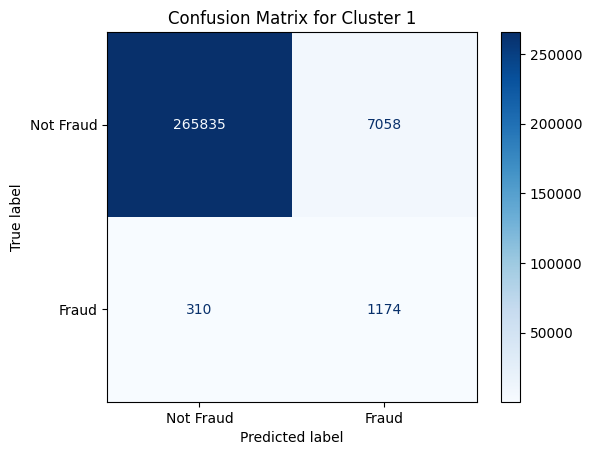

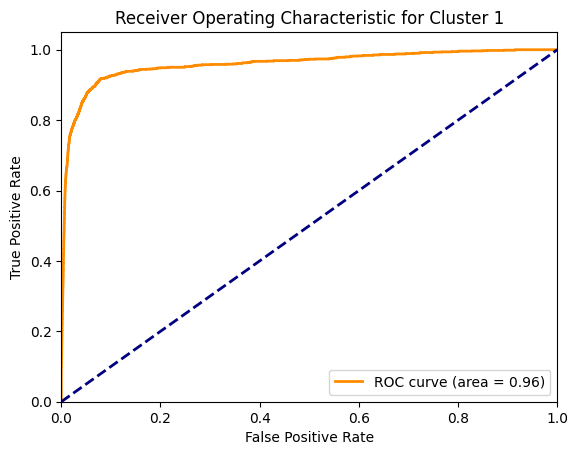


Cluster 1 Metrics:
Accuracy: 0.9731
Precision: 0.1426
Recall: 0.7911
F1-Score: 0.2417

Cluster 1 Results:
Actual fraud counts:
1484

Detected fraud counts:
1174

Mean Anomaly Score by is_fraud:
0    0.817148
1    4.912940
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 48.49785232543945, Actual Fraud: 1
Index: 1, Anomaly Score: 44.61741256713867, Actual Fraud: 1
Index: 2, Anomaly Score: 43.896766662597656, Actual Fraud: 1
Index: 3, Anomaly Score: 41.2410774230957, Actual Fraud: 1
Index: 4, Anomaly Score: 41.18946075439453, Actual Fraud: 1
Index: 5, Anomaly Score: 37.840694427490234, Actual Fraud: 1
Index: 6, Anomaly Score: 36.18842697143555, Actual Fraud: 1
Index: 7, Anomaly Score: 35.70216751098633, Actual Fraud: 1
Index: 8, Anomaly Score: 35.65574645996094, Actual Fraud: 1
Index: 9, Anomaly Score: 35.43808364868164, Actual Fraud: 1


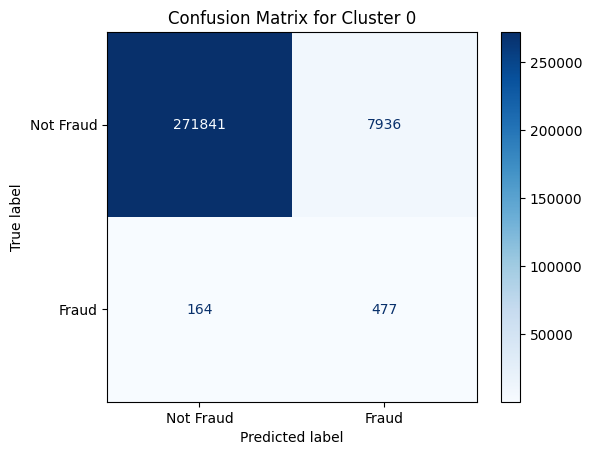

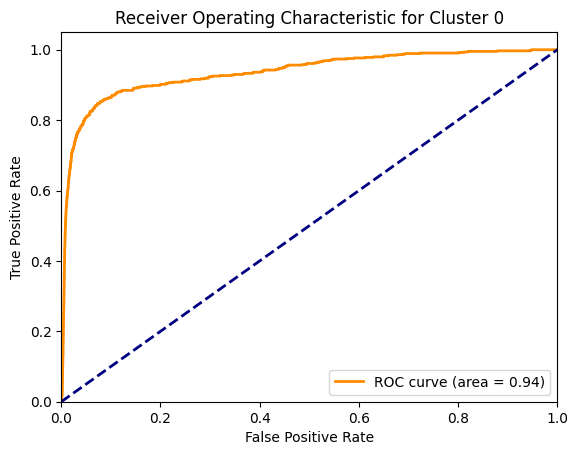


Cluster 0 Metrics:
Accuracy: 0.9711
Precision: 0.0567
Recall: 0.7441
F1-Score: 0.1054

Cluster 0 Results:
Actual fraud counts:
641

Detected fraud counts:
477

Mean Anomaly Score by is_fraud:
0    0.928985
1    2.729586
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 20.327173233032227, Actual Fraud: 0
Index: 1, Anomaly Score: 19.84192657470703, Actual Fraud: 0
Index: 2, Anomaly Score: 17.240602493286133, Actual Fraud: 0
Index: 3, Anomaly Score: 16.76420783996582, Actual Fraud: 0
Index: 4, Anomaly Score: 16.632591247558594, Actual Fraud: 0
Index: 5, Anomaly Score: 15.594315528869629, Actual Fraud: 0
Index: 6, Anomaly Score: 15.085627555847168, Actual Fraud: 0
Index: 7, Anomaly Score: 14.832357406616211, Actual Fraud: 0
Index: 8, Anomaly Score: 14.617096900939941, Actual Fraud: 0
Index: 9, Anomaly Score: 13.96480655670166, Actual Fraud: 0


In [11]:
cluster_results = evaluate_autoencoder_on_test_per_cluster(
    autoencoder_models, 
    data_cluster_card_test, 
    feature_columns, 
    'cluster'
)

## Applying XAI on autoencoder + clustering (Card features )

In [18]:
def get_reconstruction_errors(models, data, feature_columns, cluster_column='cluster', sample_size=100):
    errors = {}
    
    for cluster, model in models.items():
        cluster_data = data[data[cluster_column] == cluster].sample(n=sample_size, random_state=42)
        X = cluster_data[feature_columns]
        
        recon_error = model.decision_function(X)  
        errors[cluster] = recon_error
    
    return errors

reconstruction_errors = get_reconstruction_errors(autoencoder_models, data_cluster_card, feature_columns, cluster_column='cluster', sample_size=100)


In [24]:
import shap

def generate_shap_summary_plots(autoencoder_models, data_cluster_card, feature_columns, n_samples=100, random_state=42):
    """
    Generate SHAP summary plots for each cluster.

    Parameters:
    - autoencoder_models (dict): Dictionary where keys are cluster labels and values are trained models.
    - data_cluster_card (pd.DataFrame): DataFrame containing the data with cluster labels.
    - feature_columns (list): List of feature column names used for SHAP calculations.
    - n_samples (int): Number of samples to use for SHAP calculations and plots.
    - random_state (int): Random state for reproducibility.
    """
    shap_values = {}

    for cluster, model in autoencoder_models.items():
        cluster_data = data_cluster_card[data_cluster_card['cluster'] == cluster].sample(n=n_samples, random_state=random_state)
        X = cluster_data[feature_columns]
        
        explainer = shap.KernelExplainer(model.decision_function, X) 
        
        shap_values[cluster] = explainer.shap_values(X)
    
    for cluster, shap_val in shap_values.items():
        cluster_data = data_cluster_card[data_cluster_card['cluster'] == cluster].sample(n=n_samples, random_state=random_state)
        X = cluster_data[feature_columns]
        
        print(f"Cluster {cluster}:")
        shap.summary_plot(shap_val, X)


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Cluster 1:


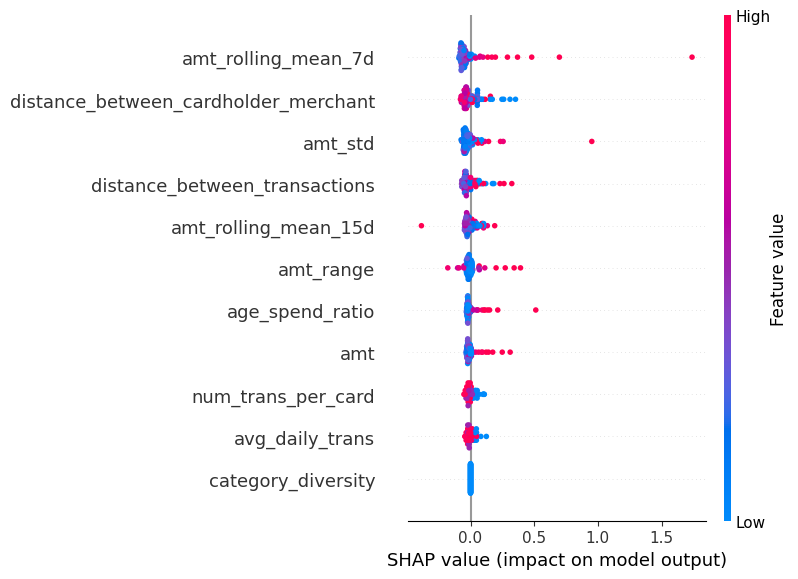

Cluster 0:


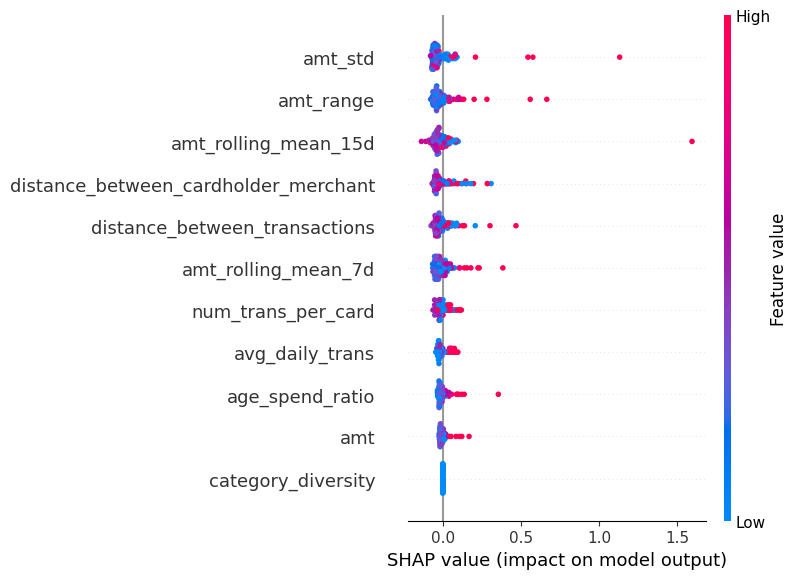

In [25]:
generate_shap_summary_plots(autoencoder_models, data_cluster_card, feature_columns)


**Interpretation:**
- amt_rolling_mean_7d (average transaction amount over 7 days) has the most significant impact on the model's predictions. Higher values (red dots) seem to push the model's output positively (right on the X-axis), indicating that higher recent spending increases the likelihood of fraud
- distance_between_cardholder_merchant also has a notable influence, where longer distances (red dots) generally push the model’s prediction positively, which might suggest that larger distances between the cardholder and the merchant could be an indicator of unusual behavior.
- amt_std (standard deviation of transaction amounts) indicates that higher variability in spending (red dots) typically increases the model’s output.
- For other features like category_diversity and avg_daily_trans, the pattern is less clear, but they still contribute to the overall prediction.

## Waterfall Shap

In [22]:
import shap

def plot_shap_waterfall_for_first_instance(models, data, feature_columns, cluster_column='cluster', sample_size=100):
    """
    Generate SHAP waterfall plots for the first instance in each cluster.
    
    Parameters:
    - models: Dictionary of trained autoencoder models, keyed by cluster.
    - data: DataFrame containing the data.
    - feature_columns: List of columns used as features.
    - cluster_column: The name of the column containing cluster labels.
    - sample_size: The number of samples to draw from each cluster (default is 100).
    
    Returns:
    - None. Displays SHAP waterfall plots for the first instance in each cluster.
    """
    shap_values_first_instance = {}

    for cluster, model in models.items():
        cluster_data = data[data[cluster_column] == cluster].sample(n=sample_size, random_state=42)
        X_sample = cluster_data[feature_columns]
        
        first_instance = X_sample.iloc[0:1]
        
        explainer = shap.KernelExplainer(model.decision_function, X_sample)
        
        shap_values = explainer.shap_values(first_instance)
        
        shap_values_first_instance[cluster] = (shap_values, first_instance, explainer)

    for cluster, (shap_val, first_instance, explainer) in shap_values_first_instance.items():
        print(f"Cluster {cluster}:")
        
        shap.waterfall_plot(shap.Explanation(values=shap_val[0], 
                                             base_values=explainer.expected_value, 
                                             data=first_instance.values[0], 
                                             feature_names=first_instance.columns.tolist()))



  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Cluster 1:


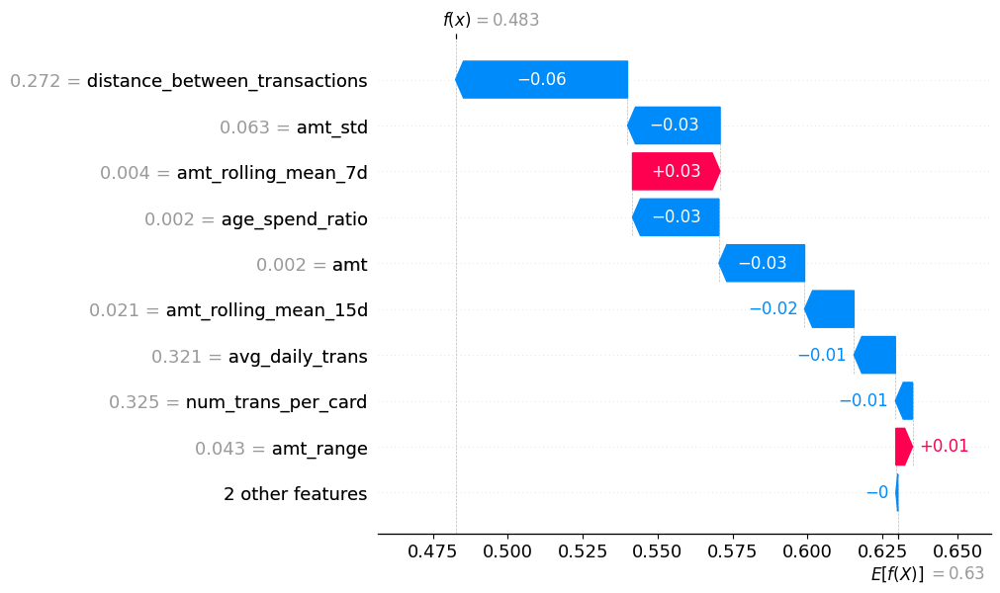

Cluster 0:


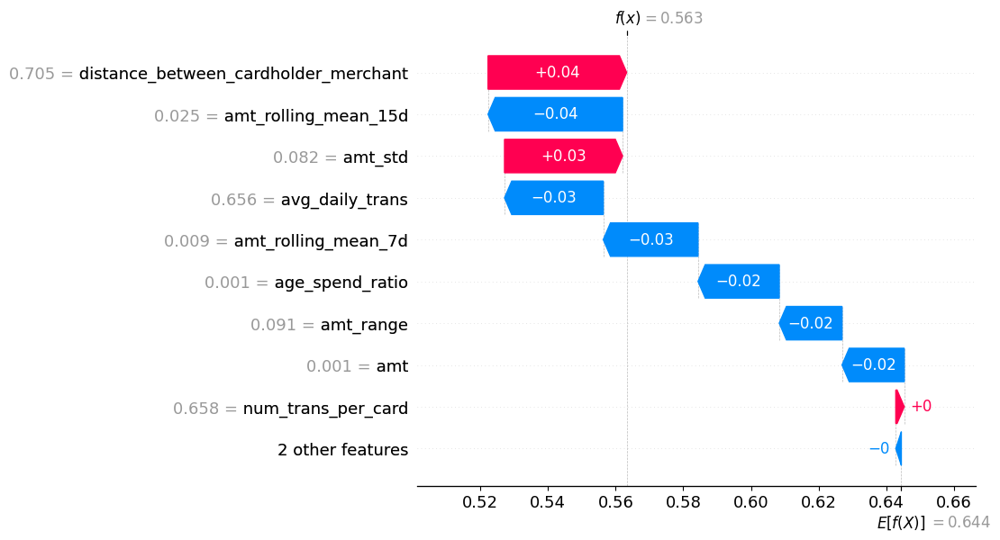

In [23]:
plot_shap_waterfall_for_first_instance(models=autoencoder_models, 
                                       data=data_cluster_card, 
                                       feature_columns=feature_columns, 
                                       cluster_column='cluster', 
                                       sample_size=100)


cluster 1:

Top Features
Distance Between Transactions (0.272):

This feature has the highest importance, indicating that the time or geographical distance between consecutive transactions plays a crucial role in predicting the outcome. A larger distance might indicate a higher likelihood of fraud.
Average Daily Transactions (0.321) & Number of Transactions per Card (0.325):

High values in these features could indicate abnormal transaction patterns, potentially flagging suspicious activity.
2. Feature Contributions
Negative Contributions:

Affected Features: distance_between_transactions, amt_std, age_spend_ratio, amt.
These features have negative SHAP values, reducing the model's prediction. This suggests that certain levels of these factors might be associated with lower fraud risk. For example, the age_spend_ratio—which measures how a customer's spending compares to typical spending patterns for their age group—can influence fraud detection. If a customer’s spending is consistent with their age group, it may reduce suspicion, while deviations could increase the risk.
Positive Contributions:

Affected Feature: amt_rolling_mean_7d.
Some features, like amt_rolling_mean_7d, contribute positively in specific cases, slightly increasing the likelihood of fraud. This could imply that recent spending patterns (e.g., an increase in the rolling mean) are indicative of potential fraudulent behavior.
3. Business Insights
Transaction Patterns:

Monitoring the distance between transactions (both in time and location) is critical. Unusual patterns, such as frequent transactions in different locations within short intervals, could signal fraud.
Customer Spending Behavior:

Analyzing the variability in transaction amounts (amt_std), changes in spending behavior over time (amt_rolling_mean_7d), and the spending ratio based on age (age_spend_ratio) can help in understanding normal versus suspicious activity. The age_spend_ratio can be particularly insightful, as it allows businesses to assess whether a customer’s spending habits align with typical behaviors for their age group, potentially flagging outliers for further investigation.

 **cluster 0**
 Top Features
Distance Between Cardholder and Merchant (0.705):
This feature is the most critical in this cluster, suggesting that the geographical distance between the cardholder and the merchant significantly influences the prediction. A higher distance seems to slightly increase the likelihood of fraud, as indicated by the SHAP value of +0.04.
2. Feature Contributions
Positive Contributions:
Affected Features: distance_between_cardholder_merchant, amt_std.
The distance_between_cardholder_merchant contributes positively to the prediction with a SHAP value of +0.04, indicating that a larger distance increases the likelihood of fraud in this cluster.
Similarly, amt_std has a positive contribution of +0.03, which could suggest that variability in transaction amounts might be associated with higher fraud risk.
Negative Contributions:
Affected Features: amt_rolling_mean_15d, avg_daily_trans, amt_rolling_mean_7d, age_spend_ratio, amt_range, amt, num_trans_per_card.
amt_rolling_mean_15d has a negative SHAP value of -0.04, meaning that a higher rolling mean of transaction amounts over 15 days decreases the likelihood of fraud.
Both avg_daily_trans and amt_rolling_mean_7d show negative contributions of -0.03, suggesting that consistent spending patterns over time are less likely to be fraudulent.
The age_spend_ratio, which compares the spending behavior of a cardholder to their age group, also has a slight negative contribution of -0.02. This indicates that if the cardholder’s spending aligns with typical behavior for their age, the model is less likely to flag the transaction as fraudulent.
Other features like amt_range and amt also have small negative contributions, indicating that typical spending ranges and amounts decrease the fraud prediction slightly.
3. Business Insights
Transaction Patterns:
The significant importance of the distance_between_cardholder_merchant highlights the need to monitor the physical distance between where the cardholder is and where the transaction occurs. Transactions occurring far from a cardholder’s usual locations may require additional scrutiny.
Customer Spending Behavior:
The negative contributions of avg_daily_trans, amt_rolling_mean_7d, and age_spend_ratio suggest that consistent and typical spending behavior across different timescales and demographic segments is less likely to be associated with fraud. Monitoring for deviations from these norms could enhance fraud detection.

## Applying autoencoder on merchant features with 3 clusters

In [30]:
feature_columns = [col for col in data_cluster_merchant.columns if col not in ['is_fraud', 'cluster', 'Component 1', 'Component 2']]
autoencoder_models_merchant= train_autoencoder_per_cluster(data_cluster_merchant, feature_columns, cluster_column='cluster')


Training: 100%|██████████| 10/10 [03:08<00:00, 18.84s/it]


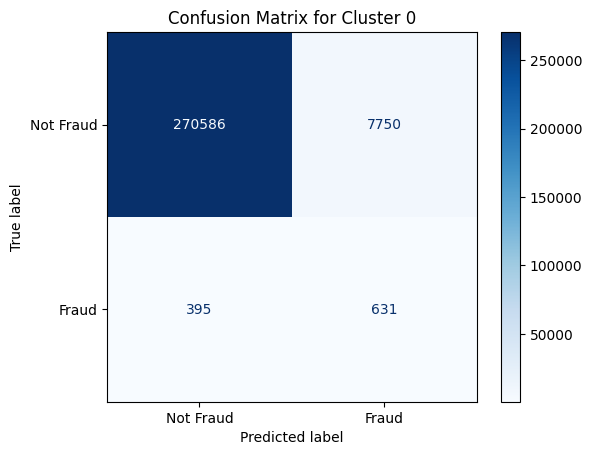

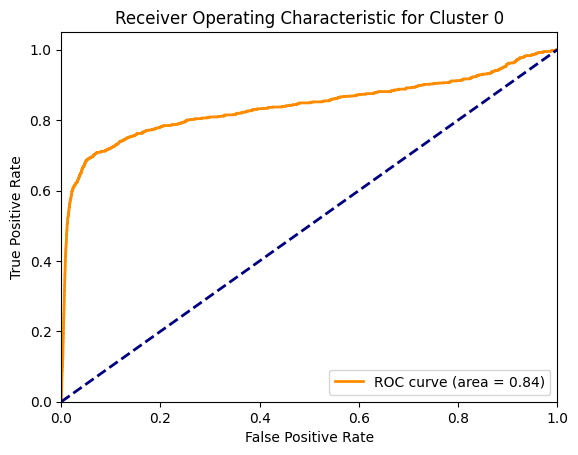


Cluster 0 Metrics:
Accuracy: 0.9708
Precision: 0.0753
Recall: 0.6150
F1-Score: 0.1342

Cluster 0 Results:
Actual fraud counts:
1026

Detected fraud counts:
631

Mean Anomaly Score by is_fraud:
0    0.475839
1    1.098963
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 10.265748023986816, Actual Fraud: 0
Index: 1, Anomaly Score: 9.9998140335083, Actual Fraud: 0
Index: 2, Anomaly Score: 8.940004348754883, Actual Fraud: 0
Index: 3, Anomaly Score: 8.276788711547852, Actual Fraud: 0
Index: 4, Anomaly Score: 7.236353397369385, Actual Fraud: 0
Index: 5, Anomaly Score: 6.7010908126831055, Actual Fraud: 0
Index: 6, Anomaly Score: 6.38214635848999, Actual Fraud: 0
Index: 7, Anomaly Score: 6.161899089813232, Actual Fraud: 0
Index: 8, Anomaly Score: 5.20357084274292, Actual Fraud: 0
Index: 9, Anomaly Score: 5.009450435638428, Actual Fraud: 1


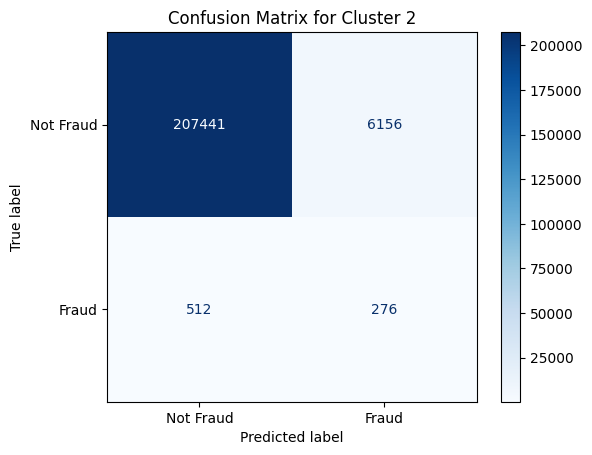

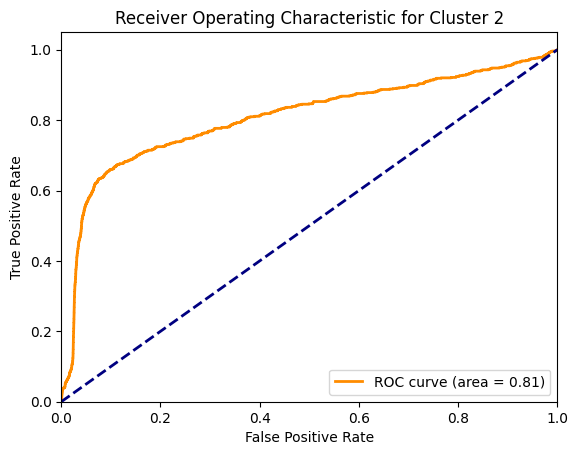


Cluster 2 Metrics:
Accuracy: 0.9689
Precision: 0.0429
Recall: 0.3503
F1-Score: 0.0765

Cluster 2 Results:
Actual fraud counts:
788

Detected fraud counts:
276

Mean Anomaly Score by is_fraud:
0    1.162030
1    1.672789
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 6.862825393676758, Actual Fraud: 0
Index: 1, Anomaly Score: 5.97810173034668, Actual Fraud: 1
Index: 2, Anomaly Score: 5.06675910949707, Actual Fraud: 0
Index: 3, Anomaly Score: 4.87691068649292, Actual Fraud: 0
Index: 4, Anomaly Score: 4.765765190124512, Actual Fraud: 0
Index: 5, Anomaly Score: 4.605113983154297, Actual Fraud: 0
Index: 6, Anomaly Score: 4.582696437835693, Actual Fraud: 0
Index: 7, Anomaly Score: 4.520424842834473, Actual Fraud: 0
Index: 8, Anomaly Score: 4.508045673370361, Actual Fraud: 0
Index: 9, Anomaly Score: 4.379013538360596, Actual Fraud: 0


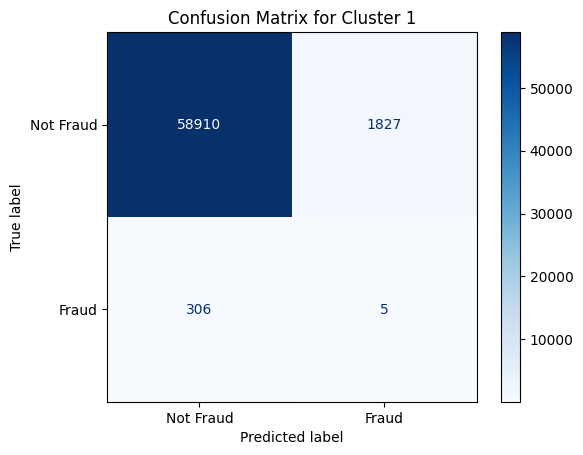

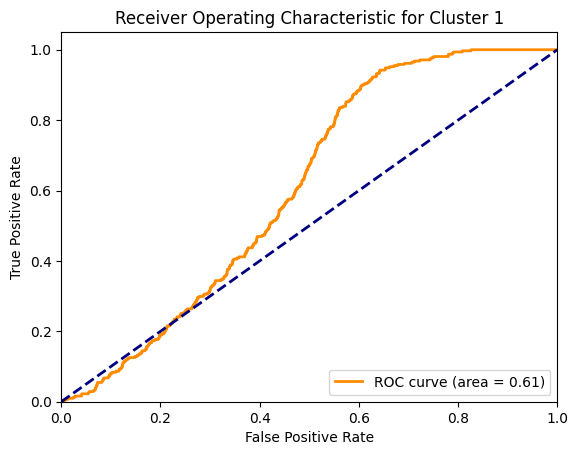


Cluster 1 Metrics:
Accuracy: 0.9651
Precision: 0.0027
Recall: 0.0161
F1-Score: 0.0047

Cluster 1 Results:
Actual fraud counts:
311

Detected fraud counts:
5

Mean Anomaly Score by is_fraud:
0    2.102826
1    2.284019
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 22.350418090820312, Actual Fraud: 0
Index: 1, Anomaly Score: 19.416467666625977, Actual Fraud: 0
Index: 2, Anomaly Score: 15.87378978729248, Actual Fraud: 0
Index: 3, Anomaly Score: 15.324551582336426, Actual Fraud: 0
Index: 4, Anomaly Score: 15.32351016998291, Actual Fraud: 0
Index: 5, Anomaly Score: 15.267435073852539, Actual Fraud: 0
Index: 6, Anomaly Score: 15.126494407653809, Actual Fraud: 0
Index: 7, Anomaly Score: 15.03326416015625, Actual Fraud: 0
Index: 8, Anomaly Score: 14.934188842773438, Actual Fraud: 0
Index: 9, Anomaly Score: 14.90439224243164, Actual Fraud: 0


In [31]:
cluster_results = evaluate_autoencoder_on_test_per_cluster(
    autoencoder_models_merchant, 
    data_cluster_merchant_test, 
    feature_columns, 
    'cluster'
)

## Waterfall plot for merchant features

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Cluster 0:


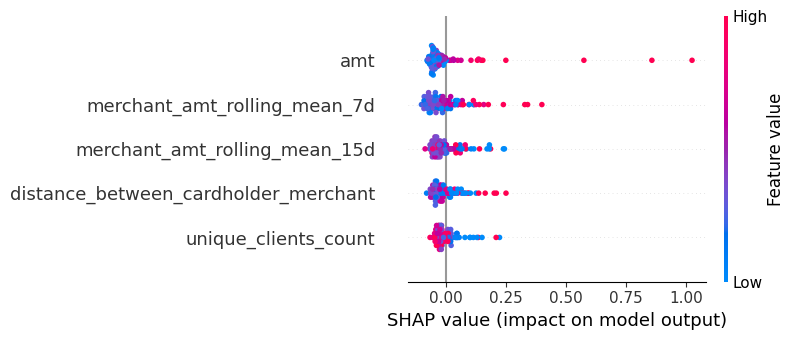

Cluster 1:


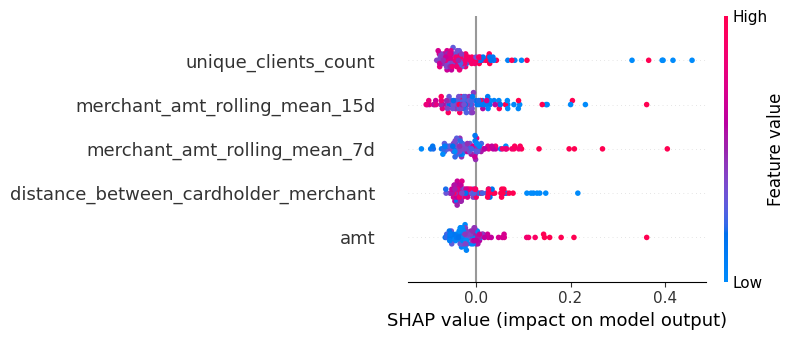

Cluster 2:


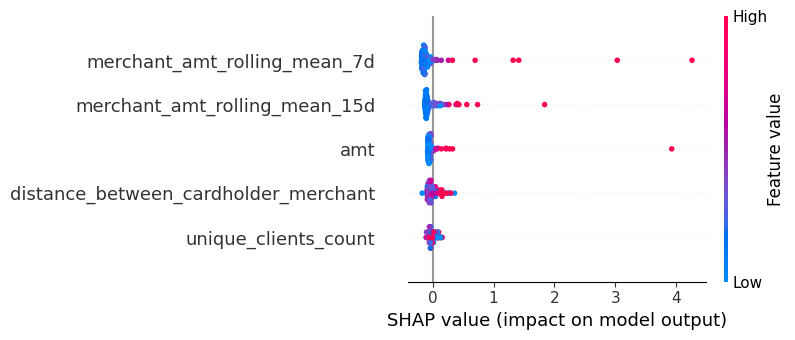

In [32]:
generate_shap_summary_plots(autoencoder_models_merchant, data_cluster_merchant, feature_columns)


## Applying autoencoder on merchant features with 2 clusters

In [18]:
feature_columns = [col for col in data_cluster_merchant_2.columns if col not in ['is_fraud', 'cluster', 'Component 1', 'Component 2']]
autoencoder_models = train_autoencoder_per_cluster(data_cluster_merchant_2, feature_columns, cluster_column='cluster')


Training: 100%|██████████| 10/10 [12:04<00:00, 72.47s/it]


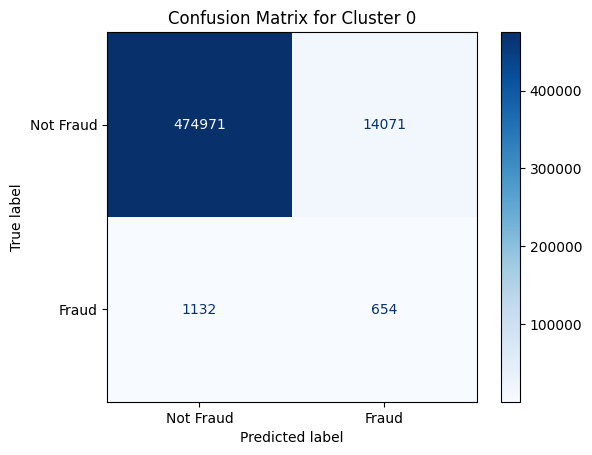

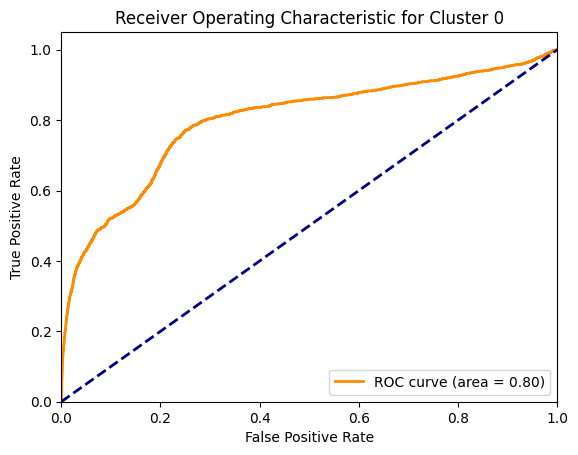


Cluster 0 Metrics:
Accuracy: 0.9690
Precision: 0.0444
Recall: 0.3662
F1-Score: 0.0792

Cluster 0 Results:
Actual fraud counts:
1786

Detected fraud counts:
654

Mean Anomaly Score by is_fraud:
0    0.708117
1    1.473515
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 7.2337470054626465, Actual Fraud: 0
Index: 1, Anomaly Score: 6.597071647644043, Actual Fraud: 0
Index: 2, Anomaly Score: 6.256382465362549, Actual Fraud: 0
Index: 3, Anomaly Score: 6.005645751953125, Actual Fraud: 0
Index: 4, Anomaly Score: 5.96950626373291, Actual Fraud: 0
Index: 5, Anomaly Score: 5.550721645355225, Actual Fraud: 0
Index: 6, Anomaly Score: 5.492037773132324, Actual Fraud: 0
Index: 7, Anomaly Score: 5.220051288604736, Actual Fraud: 0
Index: 8, Anomaly Score: 4.850764274597168, Actual Fraud: 0
Index: 9, Anomaly Score: 4.830101013183594, Actual Fraud: 0


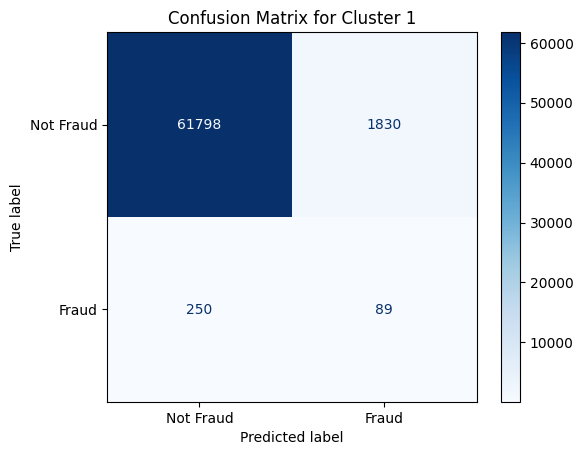

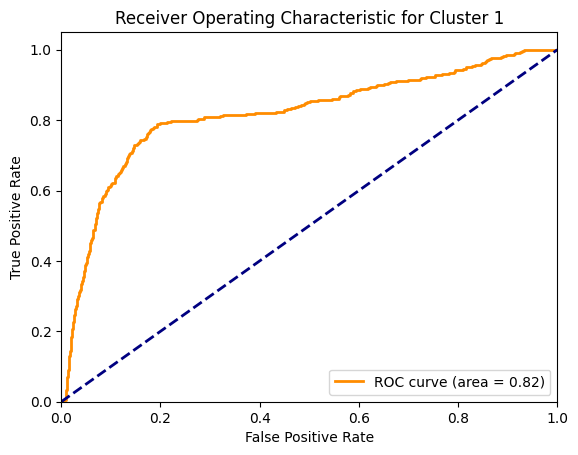


Cluster 1 Metrics:
Accuracy: 0.9675
Precision: 0.0464
Recall: 0.2625
F1-Score: 0.0788

Cluster 1 Results:
Actual fraud counts:
339

Detected fraud counts:
89

Mean Anomaly Score by is_fraud:
0    1.124626
1    1.770406
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 25.79863929748535, Actual Fraud: 0
Index: 1, Anomaly Score: 23.677452087402344, Actual Fraud: 0
Index: 2, Anomaly Score: 21.71503257751465, Actual Fraud: 0
Index: 3, Anomaly Score: 19.82215118408203, Actual Fraud: 0
Index: 4, Anomaly Score: 19.11073875427246, Actual Fraud: 0
Index: 5, Anomaly Score: 17.641504287719727, Actual Fraud: 0
Index: 6, Anomaly Score: 16.155813217163086, Actual Fraud: 0
Index: 7, Anomaly Score: 15.8616943359375, Actual Fraud: 0
Index: 8, Anomaly Score: 15.37110710144043, Actual Fraud: 0
Index: 9, Anomaly Score: 15.310812950134277, Actual Fraud: 0


In [19]:
cluster_results = evaluate_autoencoder_on_test_per_cluster(
    autoencoder_models, 
    data_cluster_merchant_test_2, 
    feature_columns, 
    'cluster'
)

## Autoencoder with merchant features

In [28]:
feature_columns = [col for col in data_cluster_merchant_3.columns if col not in ['is_fraud', 'cluster', 'Component 1', 'Component 2']]
autoencoder_models_merchant= train_autoencoder_per_cluster(data_cluster_merchant_3, feature_columns, cluster_column='cluster')


Training: 100%|██████████| 10/10 [18:23<00:00, 110.30s/it]


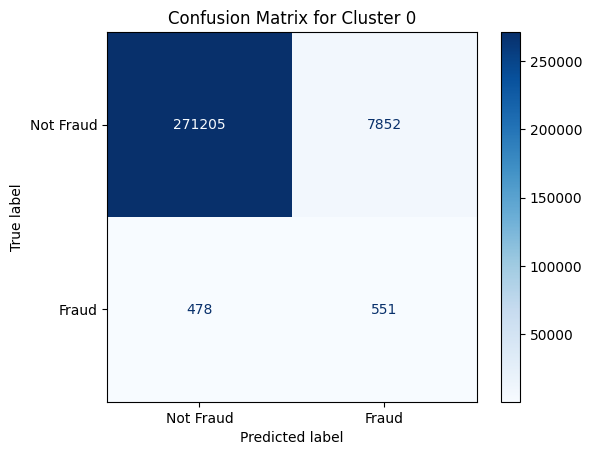

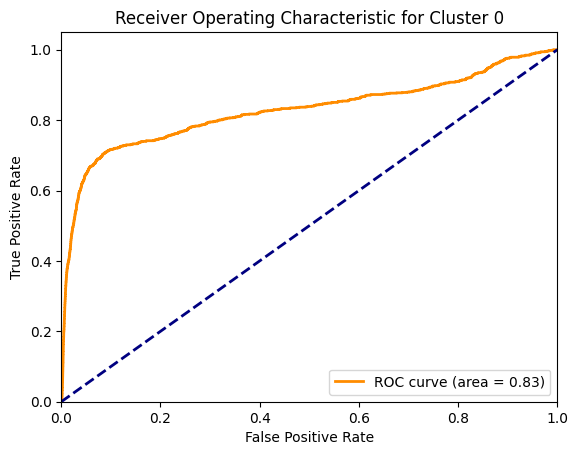


Cluster 0 Metrics:
Accuracy: 0.9703
Precision: 0.0656
Recall: 0.5355
F1-Score: 0.1168

Cluster 0 Results:
Actual fraud counts:
1029

Detected fraud counts:
551

Mean Anomaly Score by is_fraud:
0    0.695471
1    1.720154
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 45.49014663696289, Actual Fraud: 0
Index: 1, Anomaly Score: 23.83417320251465, Actual Fraud: 1
Index: 2, Anomaly Score: 21.058855056762695, Actual Fraud: 0
Index: 3, Anomaly Score: 17.653038024902344, Actual Fraud: 0
Index: 4, Anomaly Score: 17.35061264038086, Actual Fraud: 0
Index: 5, Anomaly Score: 13.446852684020996, Actual Fraud: 0
Index: 6, Anomaly Score: 11.795527458190918, Actual Fraud: 0
Index: 7, Anomaly Score: 11.610268592834473, Actual Fraud: 1
Index: 8, Anomaly Score: 11.063857078552246, Actual Fraud: 0
Index: 9, Anomaly Score: 10.90362548828125, Actual Fraud: 0


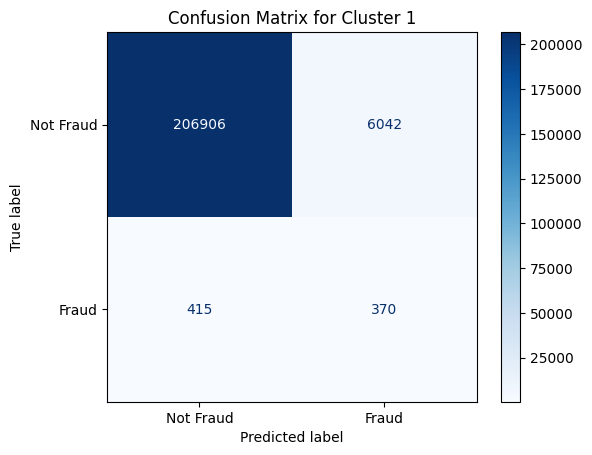

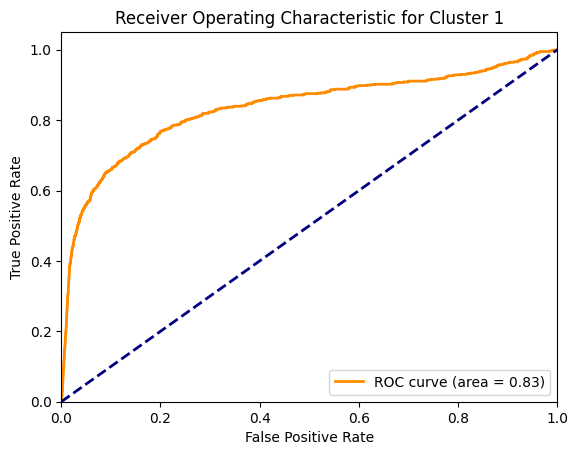


Cluster 1 Metrics:
Accuracy: 0.9698
Precision: 0.0577
Recall: 0.4713
F1-Score: 0.1028

Cluster 1 Results:
Actual fraud counts:
785

Detected fraud counts:
370

Mean Anomaly Score by is_fraud:
0    0.644285
1    1.478016
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 22.838308334350586, Actual Fraud: 0
Index: 1, Anomaly Score: 18.41267204284668, Actual Fraud: 1
Index: 2, Anomaly Score: 13.085648536682129, Actual Fraud: 0
Index: 3, Anomaly Score: 9.300654411315918, Actual Fraud: 0
Index: 4, Anomaly Score: 9.087929725646973, Actual Fraud: 0
Index: 5, Anomaly Score: 8.892707824707031, Actual Fraud: 0
Index: 6, Anomaly Score: 8.862005233764648, Actual Fraud: 0
Index: 7, Anomaly Score: 8.448741912841797, Actual Fraud: 0
Index: 8, Anomaly Score: 8.35976791381836, Actual Fraud: 0
Index: 9, Anomaly Score: 8.33629322052002, Actual Fraud: 0


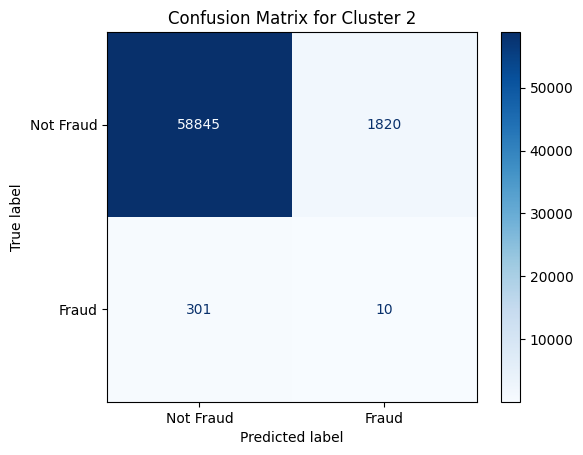

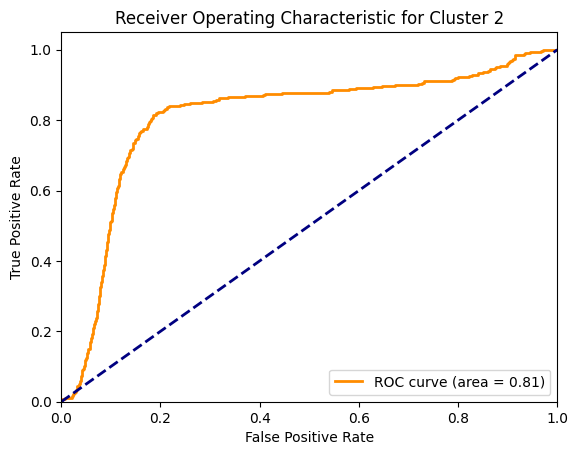


Cluster 2 Metrics:
Accuracy: 0.9652
Precision: 0.0055
Recall: 0.0322
F1-Score: 0.0093

Cluster 2 Results:
Actual fraud counts:
311

Detected fraud counts:
10

Mean Anomaly Score by is_fraud:
0    0.550446
1    1.012624
dtype: float32

Top 10 Anomalies:
Index: 0, Anomaly Score: 13.379170417785645, Actual Fraud: 0
Index: 1, Anomaly Score: 11.928010940551758, Actual Fraud: 0
Index: 2, Anomaly Score: 10.977638244628906, Actual Fraud: 0
Index: 3, Anomaly Score: 10.924688339233398, Actual Fraud: 0
Index: 4, Anomaly Score: 10.55409049987793, Actual Fraud: 0
Index: 5, Anomaly Score: 10.54151439666748, Actual Fraud: 0
Index: 6, Anomaly Score: 10.527080535888672, Actual Fraud: 0
Index: 7, Anomaly Score: 10.510021209716797, Actual Fraud: 0
Index: 8, Anomaly Score: 9.54689884185791, Actual Fraud: 0
Index: 9, Anomaly Score: 8.495121002197266, Actual Fraud: 0


In [29]:
cluster_results = evaluate_autoencoder_on_test_per_cluster(
    autoencoder_models_merchant, 
    data_cluster_merchant_test_3, 
    feature_columns, 
    'cluster'
)